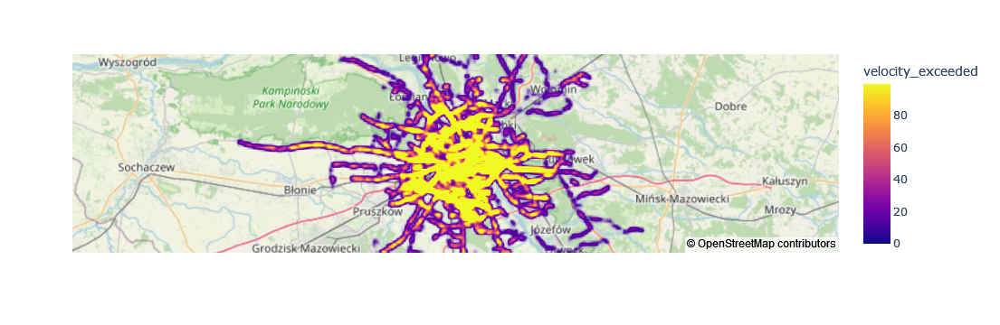

In [6]:
import pandas as pd
df = pd.read_csv('analizer\\velocity_exceeded.csv')

import plotly.express as px
fig = px.density_mapbox(df, lat='szer_geo', lon='dl_geo', z='velocity_exceeded', radius=4,
                        center=dict(lat=52.25, lon=21), zoom=8.3,
                        mapbox_style="open-street-map")
fig.show()

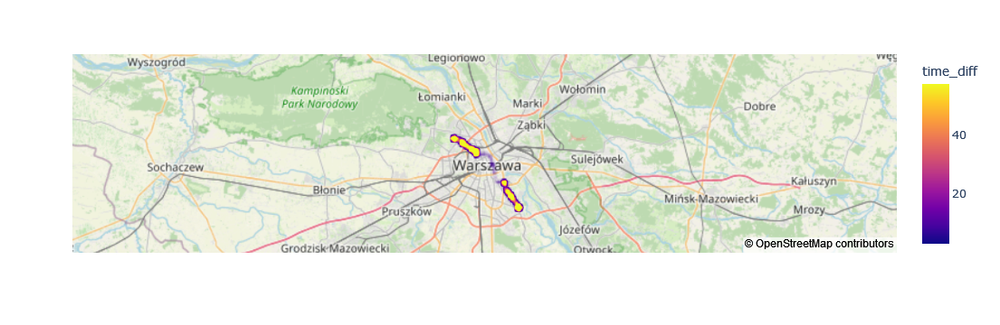

In [2]:
import pandas as pd
df = pd.read_csv('data\\buses_late_or_early180.csv')

import plotly.express as px
fig = px.density_mapbox(df, lat='szer_geo_stop', lon='dl_geo_stop', z='time_diff', radius=4,
                        center=dict(lat=52.25, lon=21), zoom=8.3,
                        mapbox_style="open-street-map")
fig.show()

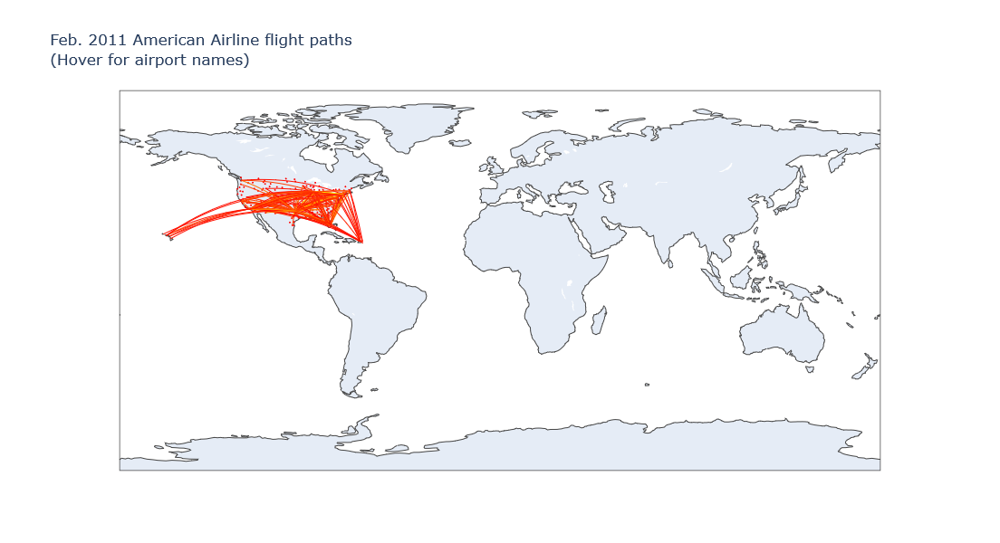

In [17]:
import plotly.graph_objects as go
import pandas as pd

df_airports = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_us_airport_traffic.csv')
df_airports.head()

df_flight_paths = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_aa_flight_paths.csv')
df_flight_paths.head()

fig = go.Figure()

fig.add_trace(go.Scattergeo(
    lon = df_airports['long'],
    lat = df_airports['lat'],
    hoverinfo = 'text',
    text = df_airports['airport'],
    mode = 'markers',
    marker = dict(
        size = 2,
        color = 'rgb(255, 0, 0)',
        line = dict(
            width = 3,
            color = 'rgba(68, 68, 68, 0)'
        )
    )))

flight_paths = []
for i in range(len(df_flight_paths)):
    fig.add_trace(
        go.Scattergeo(
            locationmode = 'USA-states',
            lon = [df_flight_paths['start_lon'][i], df_flight_paths['end_lon'][i]],
            lat = [df_flight_paths['start_lat'][i], df_flight_paths['end_lat'][i]],
            mode = 'lines',
            line = dict(width = 1,color = 'rgb(255,' +
                        str( 
                            round(float(df_flight_paths['cnt'][i]) / float(df_flight_paths['cnt'].max()) * 255)
                        ) + ', 0)'
                       ),
            opacity = 1,
        )
    )

fig.update_layout(
    title_text = 'Feb. 2011 American Airline flight paths<br>(Hover for airport names)',
    showlegend = False,
    geo = dict(
        projection_type = 'orthographic',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)',
    ),
    autosize=False,
    width=1000,
    height=600,
    mapbox_style="open-street-map"
)

fig.show()